In [4]:
import matplotlib.pyplot as plt
from matplotlib.image import imread
import glob
import numpy as np
import os
import random
import tensorflow as tf
from pathlib import Path
from tensorflow.keras import applications
from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import optimizers
from tensorflow.keras import metrics
from tensorflow.keras import Model
from tensorflow.keras.applications import resnet
from tensorflow.keras.applications.resnet import preprocess_input
from sklearn.neighbors import NearestNeighbors
import json

In [5]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# Simple ResNet Feature Extraction (OSEF)

## Unzip datasets

In [ ]:
!unzip gdrive/MyDrive/projet_DLIM/left.zip
!unzip gdrive/MyDrive/projet_DLIM/right.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: right/01390.jpg         
  inflating: right/00157.jpg         
  inflating: right/02490.jpg         
  inflating: right/02891.jpg         
  inflating: right/04734.jpg         
  inflating: right/01262.jpg         
  inflating: right/00597.jpg         
  inflating: right/02787.jpg         
  inflating: right/05252.jpg         
  inflating: right/01609.jpg         
  inflating: right/01181.jpg         
  inflating: right/03846.jpg         
  inflating: right/02721.jpg         
  inflating: right/00688.jpg         
  inflating: right/00562.jpg         
  inflating: right/04764.jpg         
  inflating: right/03315.jpg         
  inflating: right/00820.jpg         
  inflating: right/01714.jpg         
  inflating: right/03229.jpg         
  inflating: right/00103.jpg         
  inflating: right/03082.jpg         
  inflating: right/01728.jpg         
  inflating: right/01402.jpg         
  inflatin

## Prepare Data

In [ ]:
target_shape = (200, 200)

def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, target_shape)
    return image

Data vizualisation

In [ ]:
def show_pair(left, right, predict=None):
    fig = plt.figure(figsize=(15, 15))
    nb_col = 2
    if (not predict is None):
      nb_col = 3
    axs = fig.subplots(1, nb_col)
    axs[0].imshow(left)
    axs[1].imshow(right)
    if (not predict is None):
      axs[2].imshow(predict)

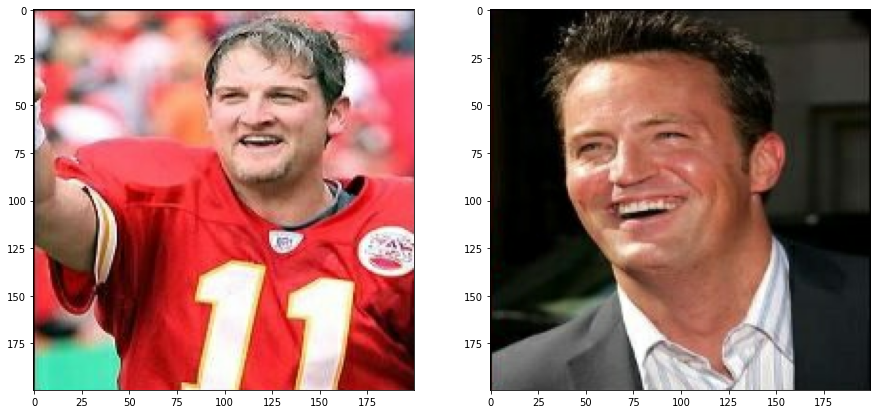

In [ ]:
show_pair(preprocess_image("left/00000.jpg"), preprocess_image("right/00000.jpg"))

In [ ]:
left_images_path = "./left/"
right_images_path = "./right/"

In [ ]:
left_images_filenames = sorted(
    [f for f in os.listdir(left_images_path)]
)

right_images_filenames = sorted(
    [f for f in os.listdir(right_images_path)]
)

In [ ]:
left_images_filenames = left_images_filenames[:1000]
right_images_filenames = right_images_filenames[:1000]

In [ ]:
ref_images = []
query_images = []

In [ ]:
for filename in left_images_filenames:
  ref_images.append(preprocess_image(left_images_path + filename))
  query_images.append(preprocess_image(right_images_path + filename))

*   ref_images: tableau numpy des images de left
*   query_images: tableau numpy des images de right

In [ ]:
ref_images = np.array(ref_images)
query_images = np.array(query_images)

## Network

On utilise ResNet50

In [ ]:
ResNet = resnet.ResNet50(
    weights="imagenet", include_top=False,  input_shape=target_shape + (3,), pooling="avg"
)
ResNet.summary()

94765736/94765736 [==============================] - 3s 0us/step
Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 206, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 100, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                          

Resnet Feature Extraction Network

On flatten juste la dernière couche de ResNet50 et on peut obtenir un embedding à partir de "resnet_feature_extractor"

In [ ]:
output = layers.Flatten()(ResNet.output)
resnet_feature_extractor = Model(ResNet.input, output, name="Embedding")
resnet_feature_extractor.summary()

Model: "Embedding"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 200, 200, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 206, 206, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 100, 100, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

## Cosine Similarity entre les embeddings

### Ref Embedding

In [ ]:
ref_images.shape

(1000, 200, 200, 3)

ref: les embedding des images de références (left)

In [ ]:
ref = resnet_feature_extractor(ref_images)

### Query

Embedding des requêtes

In [ ]:
queries_embedding = resnet_feature_extractor(query_images)

In [ ]:
queries_embedding.shape

TensorShape([1000, 2048])

In [ ]:
cosine_similarity = metrics.CosineSimilarity()

Id de la query, la on veut essayer avec l'image 0

In [ ]:
query_id = 20

On calcule la cosine_similarity entre l'embedding de toutes les images de références et l'embedding de la requête. On trie les similarités.

In [ ]:
dists = np.zeros(ref_images.shape[0])
for i, vect in enumerate(ref):
  dists[i] = cosine_similarity(vect, queries_embedding[query_id]).numpy()
ids = np.argsort(dists)

### Results

ids[-1] est censé être l'index de l'image de référence la plus ressemblante.


In [ ]:
ids[-1]

8

On verifie:

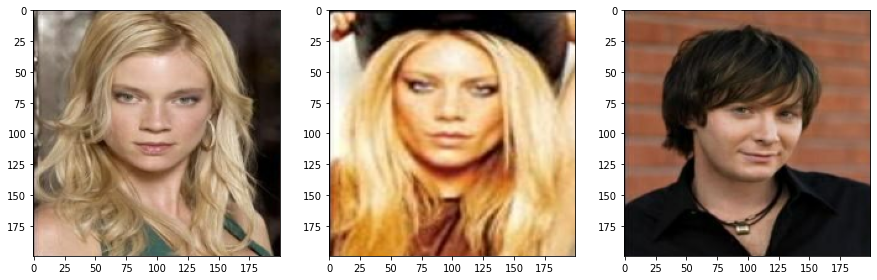

In [ ]:
show_pair(ref_images[query_id], query_images[query_id], ref_images[ids[-1]])

SAD :s    

Je pense que le dataset est trop dur, je ne sais même pas faire la différence entre les 3 gars (apparemment c'est Stalone à droite)

## Méthode k-means puis KNN

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans

In [ ]:
kmeans = MiniBatchKMeans(n_clusters=512, random_state=0).fit(train_desc)

# Siameses Network Keras Tuto (OSEF C EST JUSTE LE TUTO KERAS)

In [ ]:
#!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg1.tar.gz
#!tar -xvf jpg1.tar.gz
#!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg2.tar.gz
#!tar -xvf jpg2.tar.gz

In [ ]:
#!unzip gdrive/MyDrive/projet_DLIM/left.zip
#!unzip gdrive/MyDrive/projet_DLIM/right.zip

Le flux de sortie a été tronqué et ne contient que les 5000 dernières lignes.
  inflating: right/01390.jpg         
  inflating: right/00157.jpg         
  inflating: right/02490.jpg         
  inflating: right/02891.jpg         
  inflating: right/04734.jpg         
  inflating: right/01262.jpg         
  inflating: right/00597.jpg         
  inflating: right/02787.jpg         
  inflating: right/05252.jpg         
  inflating: right/01609.jpg         
  inflating: right/01181.jpg         
  inflating: right/03846.jpg         
  inflating: right/02721.jpg         
  inflating: right/00688.jpg         
  inflating: right/00562.jpg         
  inflating: right/04764.jpg         
  inflating: right/03315.jpg         
  inflating: right/00820.jpg         
  inflating: right/01714.jpg         
  inflating: right/03229.jpg         
  inflating: right/00103.jpg         
  inflating: right/03082.jpg         
  inflating: right/01728.jpg         
  inflating: right/01402.jpg         
  inflatin

In [ ]:
target_shape = (224, 224)

def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, target_shape)
    return image

In [ ]:
cache_dir = Path()
anchor_images_path = cache_dir / "left"
positive_images_path = cache_dir / "right"


In [ ]:
!gdown --id 1jvkbTr_giSP3Ru8OwGNCg6B4PvVbcO34
!gdown --id 1EzBZUb_mh_Dp_FKD0P4XiYYSd0QBH5zW
!unzip -oq left.zip -d $cache_dir
!unzip -oq right.zip -d $cache_dir

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser:

	 https://drive.google.com/uc?id=1jvkbTr_giSP3Ru8OwGNCg6B4PvVbcO34 

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Access denied with the following error:

 	Cannot retrieve the public link of the file. You may need to change
	the permission to 'Anyone with the link', or have had many accesses. 

You may still be able to access the file from the browser

In [ ]:
anchor_images_path

PosixPath('left')

In [ ]:
def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, target_shape)
    return image


def preprocess_triplets(anchor, positive, negative):
    """
    Given the filenames corresponding to the three images, load and
    preprocess them.
    """

    return (
        preprocess_image(anchor),
        preprocess_image(positive),
        preprocess_image(negative),
    )

In [ ]:
# We need to make sure both the anchor and positive images are loaded in
# sorted order so we can match them together.
anchor_images = sorted(
    [str(anchor_images_path / f) for f in os.listdir(anchor_images_path)]
)

positive_images = sorted(
    [str(positive_images_path / f) for f in os.listdir(positive_images_path)]
)

image_count = len(anchor_images)

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_images)
positive_dataset = tf.data.Dataset.from_tensor_slices(positive_images)

# To generate the list of negative images, let's randomize the list of
# available images and concatenate them together.
rng = np.random.RandomState(seed=42)
rng.shuffle(anchor_images)
rng.shuffle(positive_images)

negative_images = anchor_images + positive_images
np.random.RandomState(seed=32).shuffle(negative_images)

negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)
negative_dataset = negative_dataset.shuffle(buffer_size=4096)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=1024)
dataset = dataset.map(preprocess_triplets)

# Let's now split our dataset in train and validation.
train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(32, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(32, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

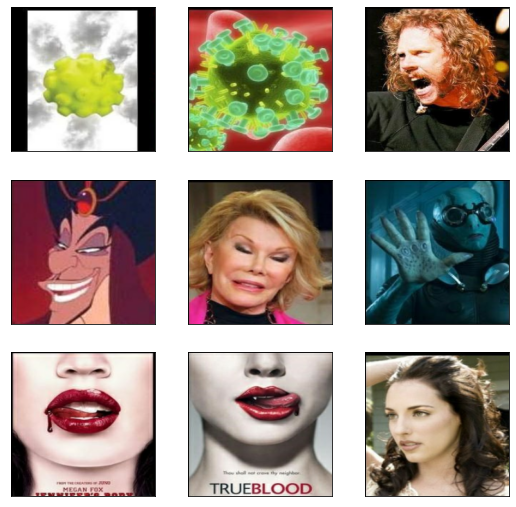

In [ ]:
def visualize(anchor, positive, negative):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(9, 9))

    axs = fig.subplots(3, 3)
    for i in range(3):
        show(axs[i, 0], anchor[i])
        show(axs[i, 1], positive[i])
        show(axs[i, 2], negative[i])


visualize(*list(train_dataset.take(1).as_numpy_iterator())[0])

In [ ]:
base_cnn = resnet.ResNet50(
    weights="imagenet", input_shape=target_shape + (3,), include_top=False, pooling="avg"
)

flatten = layers.Flatten()(base_cnn.output)
dense1 = layers.Dense(512, activation="relu")(flatten)
dense1 = layers.BatchNormalization()(dense1)
dense2 = layers.Dense(256, activation="relu")(dense1)
dense2 = layers.BatchNormalization()(dense2)
output = layers.Dense(256)(dense2)

embedding = Model(base_cnn.input, flatten, name="Embedding")

trainable = False
for layer in base_cnn.layers:
    if layer.name == "conv5_block1_out":
        trainable = True
    layer.trainable = trainable

94765736/94765736 [==============================] - 7s 0us/step


In [ ]:
base_cnn.summary()

Model: "resnet50"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                           

In [ ]:
class DistanceLayer(layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)


anchor_input = layers.Input(name="anchor", shape=target_shape + (3,))
positive_input = layers.Input(name="positive", shape=target_shape + (3,))
negative_input = layers.Input(name="negative", shape=target_shape + (3,))

distances = DistanceLayer()(
    embedding(resnet.preprocess_input(anchor_input)),
    embedding(resnet.preprocess_input(positive_input)),
    embedding(resnet.preprocess_input(negative_input)),
)

siamese_network = Model(
    inputs=[anchor_input, positive_input, negative_input], outputs=distances
)

In [ ]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape is a context manager that records every operation that
        # you do inside. We are using it here to compute the loss so we can get
        # the gradients and apply them using the optimizer specified in
        # `compile()`.
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        # Storing the gradients of the loss function with respect to the
        # weights/parameters.
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_network.trainable_weights)
        )

        # Let's update and return the training loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        # Let's update and return the loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        # The output of the network is a tuple containing the distances
        # between the anchor and the positive example, and the anchor and
        # the negative example.
        ap_distance, an_distance = self.siamese_network(data)

        # Computing the Triplet Loss by subtracting both distances and
        # making sure we don't get a negative value.
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]

In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(0.0001))
siamese_model.fit(train_dataset, epochs=15, validation_data=val_dataset)

Epoch 1/15
151/151 [==============================] - ETA: 0s - loss: 0.5746

151/151 [==============================] - 39s 141ms/step - loss: 0.5746 - val_loss: 0.3914
Epoch 2/15
150/151 [============================>.] - ETA: 0s - loss: 0.4161

151/151 [==============================] - 18s 116ms/step - loss: 0.4163 - val_loss: 0.3802
Epoch 3/15
150/151 [============================>.] - ETA: 0s - loss: 0.3810

151/151 [==============================] - 18s 117ms/step - loss: 0.3811 - val_loss: 0.3923
Epoch 4/15
150/151 [============================>.] - ETA: 0s - loss: 0.3644

151/151 [==============================] - 18s 117ms/step - loss: 0.3648 - val_loss: 0.3656
Epoch 5/15
150/151 [============================>.] - ETA: 0s - loss: 0.3512

151/151 [==============================] - 18s 118ms/step - loss: 0.3509 - val_loss: 0.3407
Epoch 6/15
150/151 [============================>.] - ETA: 0s - loss: 0.3403

151/151 [==============================] - 18s 117ms/step - loss: 0.3401 - val_loss: 0.3494
Epoch 7/15
150/151 [============================>.] - ETA: 0s - loss: 0.3293

151/151 [==============================] - 18s 117ms/step - loss: 0.3296 - val_loss: 0.3211
Epoch 8/15
150/151 [============================>.] - ETA: 0s - loss: 0.3184

151/151 [==============================] - 18s 118ms/step - loss: 0.3182 - val_loss: 0.3284
Epoch 9/15
150/151 [============================>.] - ETA: 0s - loss: 0.3102

151/151 [==============================] - 18s 117ms/step - loss: 0.3110 - val_loss: 0.3254
Epoch 10/15
150/151 [============================>.] - ETA: 0s - loss: 0.3060

151/151 [==============================] - 18s 118ms/step - loss: 0.3057 - val_loss: 0.3381
Epoch 11/15
150/151 [============================>.] - ETA: 0s - loss: 0.3028

151/151 [==============================] - 18s 117ms/step - loss: 0.3036 - val_loss: 0.3072
Epoch 12/15
150/151 [============================>.] - ETA: 0s - loss: 0.2945

151/151 [==============================] - 18s 117ms/step - loss: 0.2946 - val_loss: 0.3186
Epoch 13/15
150/151 [============================>.] - ETA: 0s - loss: 0.2904

151/151 [==============================] - 18s 118ms/step - loss: 0.2904 - val_loss: 0.3027
Epoch 14/15
150/151 [============================>.] - ETA: 0s - loss: 0.2813

151/151 [==============================] - 18s 117ms/step - loss: 0.2815 - val_loss: 0.3132
Epoch 15/15
150/151 [============================>.] - ETA: 0s - loss: 0.2808

151/151 [==============================] - 18s 117ms/step - loss: 0.2808 - val_loss: 0.2931


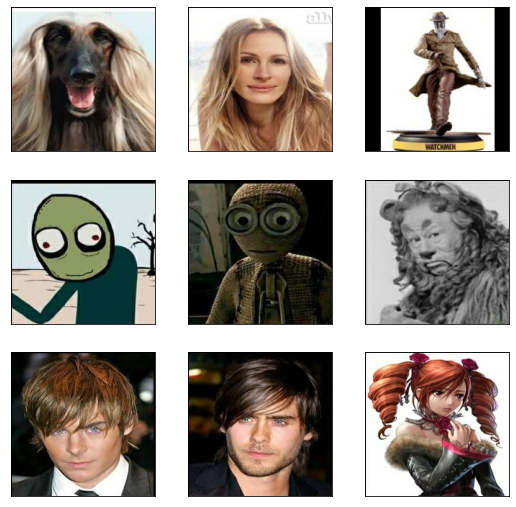

In [ ]:
sample = next(iter(train_dataset))
visualize(*sample)

anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (
    embedding(resnet.preprocess_input(anchor)),
    embedding(resnet.preprocess_input(positive)),
    embedding(resnet.preprocess_input(negative)),
)

In [ ]:
cosine_similarity = metrics.CosineSimilarity()

positive_similarity = cosine_similarity(anchor_embedding, positive_embedding)
print("Positive similarity:", positive_similarity.numpy())

negative_similarity = cosine_similarity(anchor_embedding, negative_embedding)
print("Negative similarity", negative_similarity.numpy())

Positive similarity: 0.9943123
Negative similarity 0.9920677


In [ ]:
ref = embedding.predict(train_dataset)

151/151 [==============================] - 16s 105ms/step


In [ ]:
query = preprocess_image("/content/FB_IMG_1663272260501.jpg")

In [ ]:
query_embedding = embedding.predict(positive)

1/1 [==============================] - 0s 38ms/step


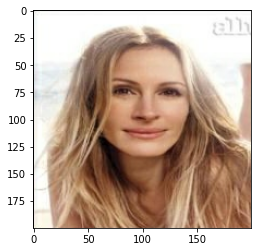

In [ ]:
plt.imshow(positive[0])

In [ ]:
queries = [query_embedding[0] for i in ref]

In [ ]:
#dists = np.linalg.norm(ref-queries, axis=1) 
dists = np.zeros(ref.shape[0])
for i, vect in enumerate(ref):
  dists[i] = cosine_similarity(vect, query_embedding)
ids = np.argsort(dists)[:8]  # Top 8 results

In [ ]:
scores = [(dists[id], anchor_images[id]) for id in ids]
print(scores)

[(0.9856057167053223, '/root/.keras/left/00084.jpg'), (0.9867948889732361, '/root/.keras/left/03198.jpg'), (0.9878418445587158, '/root/.keras/left/03956.jpg'), (0.9885929226875305, '/root/.keras/left/03303.jpg'), (0.9886991381645203, '/root/.keras/left/01323.jpg'), (0.9892394542694092, '/root/.keras/left/04706.jpg'), (0.9893006682395935, '/root/.keras/left/05719.jpg'), (0.9897164106369019, '/root/.keras/left/01741.jpg')]


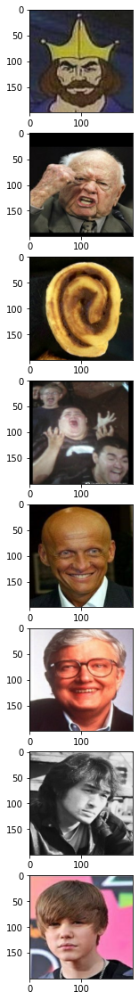

In [ ]:
fig = plt.figure(figsize=(20, 20))
axs = fig.subplots(8)
i = 0
for score, path in scores:
  axs[i].imshow(preprocess_image(path))
  i = i + 1

# INRIA Holidays Dataset

  Avant le code se basait sur la gt avec 250 query. Avec la gt de Matzim on en a 1491 car on a:
100000: [100001, 100002]
...
100001: [100000, 100002]
...
100002: [100000, 100001]

Alors que dans l'ancienne gt on aurait eu que 100000: [100001, 100002]

Du coup pour les requêtes on fait sur les 1491 (donc toutes les images) contre 250 avant. J'ai pas eu le temps de changer car je viens juste de m'en rendre compte.

## Data

### Load Data (Ne sert plus puisqu'on a tout ce qu'il faut dans le drive)

In [ ]:
#!unzip gdrive/MyDrive/projet_DLIM/INRIA_Holidays_shuffled-20221122T144350Z-001.zip

In [ ]:
#!tar -xvf INRIA_Holidays_shuffled/thumbs.tar.gz

In [ ]:
#!wget https://www.lrde.epita.fr/~jchazalo/SHARE/inria_holidays_student.tar.gz

In [ ]:
#!tar -xvf inria_holidays_student.tar.gz

In [ ]:
#!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg1.tar.gz

--2022-11-30 09:42:52--  ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg1.tar.gz
           => ‘jpg1.tar.gz’
Resolving ftp.inrialpes.fr (ftp.inrialpes.fr)... 194.199.18.221
Connecting to ftp.inrialpes.fr (ftp.inrialpes.fr)|194.199.18.221|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /pub/lear/douze/data ... done.
==> SIZE jpg1.tar.gz ... 1141827194
==> PASV ... done.    ==> RETR jpg1.tar.gz ... done.
Length: 1141827194 (1.1G) (unauthoritative)

jpg1.tar.gz         100%[===================>]   1.06G  27.6MB/s    in 34s     

2022-11-30 09:43:26 (31.9 MB/s) - ‘jpg1.tar.gz’ saved [1141827194]



In [ ]:
#!wget ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg2.tar.gz

--2022-11-30 09:43:26--  ftp://ftp.inrialpes.fr/pub/lear/douze/data/jpg2.tar.gz
           => ‘jpg2.tar.gz’
Resolving ftp.inrialpes.fr (ftp.inrialpes.fr)... 194.199.18.221
Connecting to ftp.inrialpes.fr (ftp.inrialpes.fr)|194.199.18.221|:21... connected.
Logging in as anonymous ... Logged in!
==> SYST ... done.    ==> PWD ... done.
==> TYPE I ... done.  ==> CWD (1) /pub/lear/douze/data ... done.
==> SIZE jpg2.tar.gz ... 1701364177
==> PASV ... done.    ==> RETR jpg2.tar.gz ... done.
Length: 1701364177 (1.6G) (unauthoritative)

jpg2.tar.gz         100%[===================>]   1.58G  30.6MB/s    in 74s     

2022-11-30 09:44:40 (22.1 MB/s) - ‘jpg2.tar.gz’ saved [1701364177]



In [ ]:
#!tar -xvf jpg1.tar.gz -C gdrive/MyDrive/projet_DLIM/imgs/

In [ ]:
#!tar -xvf jpg2.tar.gz -C gdrive/MyDrive/projet_DLIM/imgs/

### Preprocess

In [6]:
target_shape = (224, 224)

# PREPROCESS POUR RESNET
def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """
    image = tf.keras.utils.load_img(filename)
    image = image.convert('RGB')
    image = image.resize((target_shape))
    x = np.array(image)
    x = preprocess_input(x)
    return x

In [8]:
preprocess_image("./gdrive/MyDrive/projet_DLIM/imgs/jpg/100000.jpg")

array([[[ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        ...,
        [ 149.061   ,  128.22101 ,  112.32    ],
        [ 149.061   ,  127.221   ,  111.32    ],
        [ 148.061   ,  127.221   ,  111.32    ]],

       [[ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        ...,
        [ 150.061   ,  128.22101 ,  112.32    ],
        [ 149.061   ,  128.22101 ,  112.32    ],
        [ 149.061   ,  128.22101 ,  112.32    ]],

       [[ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        [ 151.061   ,  138.22101 ,  131.32    ],
        ...,
        [ 150.061   ,  128.22101 ,  113.32    ],
        [ 150.061   ,  128.22101 ,  113.32    ],
        [ 150.061   ,  128.22101 ,  113.32    ]],

       ...,

       [[ -88.939   ,  -74.779   ,  -76.68    ],
        [ -

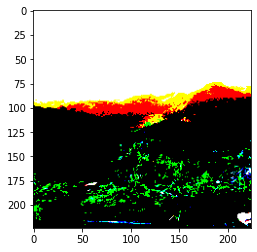

In [9]:
plt.imshow(preprocess_image("./gdrive/MyDrive/projet_DLIM/imgs/jpg/100000.jpg"))

In [12]:
PATH_TO_RESOURCES = "."
PATH_TO_RESOURCES = "./gdrive/MyDrive/projet_DLIM/"
PATH_TO_IMGS = "imgs/jpg"

In [13]:
IMG_NAMES_FULL = !ls $PATH_TO_RESOURCES/$PATH_TO_IMGS/*.jpg | sort
len(IMG_NAMES_FULL), IMG_NAMES_FULL[:5]

(1491,
 ['./gdrive/MyDrive/projet_DLIM//imgs/jpg/100000.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100001.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100002.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100100.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100101.jpg'])

In [14]:
IMG_IDS = [p.split('/')[-1][:-4] for p in IMG_NAMES_FULL]
len(IMG_IDS), IMG_IDS[:5]

(1491, ['100000', '100001', '100002', '100100', '100101'])

In [ ]:
imgid_to_index = {imgid: ii for ii, imgid in enumerate(IMG_IDS)}
imgid_to_index

## Network VGG (pas encore testé avec VGG)

On utilise VGG

In [ ]:
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input


In [ ]:
base_model = VGG16(weights='imagenet')
t_model = Model(inputs=base_model.input, outputs=base_model.get_layer('fc1').output)

553467096/553467096 [==============================] - 3s 0us/step


In [ ]:
base_model.summary()

Model: "vgg16"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

In [ ]:
t_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 224, 224, 3)]     0         
                                                                 
 block1_conv1 (Conv2D)       (None, 224, 224, 64)      1792      
                                                                 
 block1_conv2 (Conv2D)       (None, 224, 224, 64)      36928     
                                                                 
 block1_pool (MaxPooling2D)  (None, 112, 112, 64)      0         
                                                                 
 block2_conv1 (Conv2D)       (None, 112, 112, 128)     73856     
                                                                 
 block2_conv2 (Conv2D)       (None, 112, 112, 128)     147584    
                                                                 
 block2_pool (MaxPooling2D)  (None, 56, 56, 128)       0     

## Network resnet

On utilise ResNet50

In [ ]:
ResNet = resnet.ResNet50(
    weights="imagenet", include_top=False,  input_shape=target_shape + (3,), pooling="avg"
)
ResNet.summary()

Resnet Feature Extraction Network

On flatten juste la dernière couche de ResNet50 et on peut obtenir un embedding à partir de "resnet_feature_extractor"

In [17]:
output = layers.Flatten()(ResNet.output)
resnet_feature_extractor = Model(ResNet.input, output, name="Embedding")
resnet_feature_extractor.summary()

Model: "Embedding"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

## Embedding

On calcule les embeddings pour toutes les images

In [18]:
ref = []
for path in IMG_NAMES_FULL:
  tmp_img = preprocess_image(path)
  ref.append(tmp_img)

In [19]:
ref = np.array(ref)

In [20]:
ref.shape

(1491, 224, 224, 3)

On calcule les embedding de nos images du train set (les vecteurs qui représentes les images: nos features)

In [21]:
ref_embedding = resnet_feature_extractor(ref)

In [22]:
ref_embedding.shape

TensorShape([1491, 2048])

In [23]:
ref_embedding = np.array(ref_embedding)

In [24]:
embedding = np.copy(ref_embedding)

### Kmeans et KNN (+ tests PCA) : c'est mal fait ou juste nul 29%

  Pour PCA il faut centrer les données

In [ ]:
train_mean = np.mean(ref_embedding)
embedding = embedding# - train_mean

In [ ]:
embedding.shape

(1491, 2048)

#### PCA

In [2]:
# compute PCA matrix and keep only 64 dimensions
train_cov = np.dot(embedding.T, embedding)
eigvals, eigvecs = np.linalg.eig(train_cov)
perm = eigvals.argsort()                   # sort by increasing eigenvalue
pca_transform = eigvecs[:, perm[2048 - 128:2048]]   # eigenvectors for the 64 last eigenvalues
pca_transform.shape, pca_transform.dtype

NameError: ignored

In [3]:
embedding = np.dot(embedding, pca_transform)
embedding.shape

NameError: ignored

???????? Quand on utilise la PCA les valeurs sont des nombres imaginaires, pas trop cherché à savoir pourquoi

In [ ]:
embedding = np.abs(embedding)

#### Codebook

In [ ]:
from sklearn.cluster import KMeans, MiniBatchKMeans

1 cluster pour 1 query (il y en a 512 dans le data set d'INRIA donc 512 centres)

In [ ]:
kmeans = MiniBatchKMeans(n_clusters=512, random_state=0).fit(embedding)

In [ ]:
kmeans.cluster_centers_.shape

(512, 2048)

In [ ]:
global_descr = np.zeros((len(IMG_IDS), 2048), dtype=np.float32)

for ii, imgid in enumerate(IMG_IDS):
  #On centre, ou pas (si PCA il faut centrer)
  tmp = np.array([ref_embedding[ii]])# - train_mean
  #tmp = np.dot(tmp, pca_transform)
  #tmp = np.abs(tmp)
  prediction_id = kmeans.predict(tmp)
  print(prediction_id)
  prediction = kmeans.cluster_centers_[prediction_id]
  #Dans notre cas ça ne sert à rien de faire un histo comme dans le TP ou projet de MLRF
  #descr_hist = np.bincount(prediction, minlength=2048) / len(prediction)
  #global_descr[ii] = descr_hist
  global_descr[ii] = prediction
print("Indexing complete.")
global_descr.shape, global_descr.dtype

In [ ]:
search_engine = NearestNeighbors()

In [ ]:
search_engine.fit(global_descr)

NearestNeighbors()

#### Evaluation

In [ ]:
#EVALUATION
PATH_TO_GT = os.path.join(PATH_TO_RESOURCES, "gt_student.json")
gt_data = None
with open(PATH_TO_GT, 'r') as in_gt:
    gt_data = json.load(in_gt)

In [ ]:
query_imnos = [imgid_to_index[query_id] for query_id in gt_data.keys()]

In [ ]:
query_vectors = global_descr[query_imnos]


In [ ]:
distances, results = search_engine.kneighbors(query_vectors, 9)

In [ ]:
# TODO complete this code
aps = []  # list of average precisions for all queries
for qimno, qres in zip(query_imnos, results):
    qname = IMG_IDS[qimno]
#     print("query:", qname)
    # collect the positive results in the dataset
    # the positives have the same prefix as the query image
    positive_results = [imgid_to_index[img_id] for img_id in gt_data[IMG_IDS[qimno]]]
#     print("positive_results:", positive_results)
#     print("qres:", qres)
    #
    # ranks of positives. We skip the result #0, assumed to be the query image
    ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
#     print("ranks:", ranks)
    #
    # accumulate trapezoids with this basis
    recall_step = 1.0 / len(positive_results)  # FIXME what is the size of a step?
    ap = 0
    for ntp, rank in enumerate(ranks):
        # ntp = nb of true positives so far
        # rank = nb of retrieved items so far
        # y-size on left side of trapezoid:
        precision_0 = ntp/float(rank) if rank > 0 else 1.0
        # y-size on right side of trapezoid:
        precision_1 = (ntp + 1) / float(rank + 1)
        ap += recall_step * precision_0 + (recall_step * (precision_1 - precision_0)) / 2 # FIXME what is the area under the PR curve?
    print("query %s, AP = %.3f" % (qname, ap))
    aps.append(ap)

print("mean AP = %.3f" % np.mean(aps))  # FIXME mean average precision

query 90314, AP = 0.125
query 90376, AP = 1.000
query 90175, AP = 0.000
query 90949, AP = 0.083
query 90818, AP = 0.000
query 91374, AP = 0.528
query 90696, AP = 0.000
query 90464, AP = 1.000
query 90413, AP = 1.000
query 90356, AP = 0.500
query 90185, AP = 1.000
query 90284, AP = 0.000
query 90341, AP = 0.000
query 90783, AP = 0.100
query 90529, AP = 0.750
query 90721, AP = 0.750
query 91298, AP = 1.000
query 91437, AP = 0.031
query 90153, AP = 0.250
query 90581, AP = 0.000
query 90439, AP = 0.000
query 90841, AP = 0.000
query 91069, AP = 0.500
query 90766, AP = 0.528
query 90359, AP = 0.000
query 90081, AP = 0.250
query 90126, AP = 0.000
query 90531, AP = 0.000
query 90503, AP = 0.500
query 90093, AP = 0.000
query 90222, AP = 0.500
query 90977, AP = 0.062
query 90180, AP = 0.000
query 91246, AP = 0.500
query 90690, AP = 0.000
query 90669, AP = 0.278
query 90173, AP = 1.000
query 90484, AP = 0.000
query 91464, AP = 0.167
query 90631, AP = 0.050
query 91241, AP = 0.500
query 90041, AP 

<Figure size 432x288 with 0 Axes>

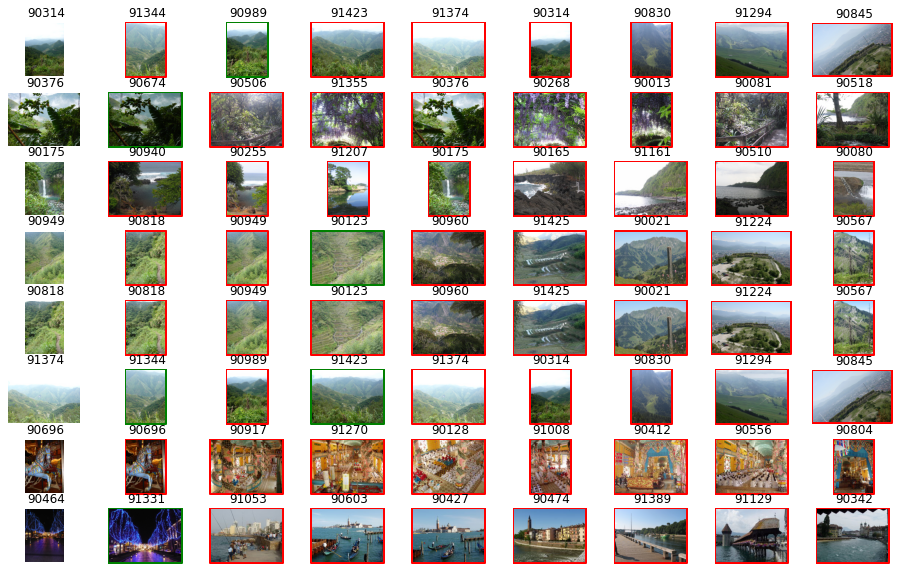

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.image import imread

nrow = 8   # number of query images to show
nres = 8   # number of results per query

def show_image(imno, frame_color):
    im = imread(os.path.join(PATH_TO_RESOURCES, "thumbs", "%s.jpg" % IMG_IDS[imno]))
    plt.imshow(im)
    h, w = im.shape[:2]
    plt.plot([0, 0, w, w, 0], [0, h, h, 0, 0], frame_color, linewidth = 2)
    plt.axis('off')

# reduce the margins
plt.subplots_adjust(wspace = 0, hspace = 0,
                    top = 0.99, bottom = 0.01, left = 0.01, right = 0.99)

plt.figure(figsize=(16,10))
no = 1  # index current of subfigure
for qno in range(nrow):
    plt.subplot(nrow, nres + 1, no); no += 1
    # show query image with white outline
    qimno = query_imnos[qno]
    show_image(qimno, 'w')
    plt.title(IMG_IDS[qimno])
    for res_rank, qres in enumerate(results[qno, 1:nres+1]): # 1:nres+1 => skip query from results
        plt.subplot(nrow, nres + 1, no); no += 1
        # use image name to determine if it is a TP or FP result
        is_ok = IMG_IDS[qres] in gt_data[IMG_IDS[qimno]]
        show_image(qres, 'g' if is_ok else 'r')
#         plt.title("%0.2f" % (distances[qno,res_rank]))
        plt.title(IMG_IDS[qres])

plt.show()

### Méthode sans codebook (pas de kmeans), mAP de 74% (0.741) contre 34% dans le TP (et 29% pour la méthode précédente)

In [27]:
PATH_TO_GT = os.path.join(PATH_TO_RESOURCES, "INRIA_HOLYDAYS.json")
gt_data = None
with open(PATH_TO_GT, 'r') as in_gt:
    gt_data = json.load(in_gt)

query_imnos = [imgid_to_index[query_id] for query_id in gt_data.keys()]

In [28]:
len(query_imnos)

1491

On calcule nos features pour les requêtes

In [29]:
query_vectors = resnet_feature_extractor(ref[query_imnos])
query_vectors = np.array(query_vectors)

In [30]:
len(query_vectors)

1491

On réutilise KNN (C'est trop long si on fait un truc à la main)

In [31]:
search_engine = NearestNeighbors()
search_engine.fit(ref_embedding)

NearestNeighbors()

In [32]:
distances, results = search_engine.kneighbors(query_vectors, 9)

In [33]:
# TODO complete this code
aps = []  # list of average precisions for all queries
for qimno, qres in zip(query_imnos, results):
    qname = IMG_IDS[qimno]
#     print("query:", qname)
    # collect the positive results in the dataset
    # the positives have the same prefix as the query image
    positive_results = [imgid_to_index[img_id] for img_id in gt_data[IMG_IDS[qimno]]]
#     print("positive_results:", positive_results)
#     print("qres:", qres)
    #
    # ranks of positives. We skip the result #0, assumed to be the query image
    ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
#     print("ranks:", ranks)
    #
    # accumulate trapezoids with this basis
    recall_step = 1.0 / len(positive_results)  # FIXME what is the size of a step?
    ap = 0
    for ntp, rank in enumerate(ranks):
        # ntp = nb of true positives so far
        # rank = nb of retrieved items so far
        # y-size on left side of trapezoid:
        precision_0 = ntp/float(rank) if rank > 0 else 1.0
        # y-size on right side of trapezoid:
        precision_1 = (ntp + 1) / float(rank + 1)
        ap += recall_step * precision_0 + (recall_step * (precision_1 - precision_0)) / 2 # FIXME what is the area under the PR curve?
    print("query %s, AP = %.3f" % (qname, ap))
    aps.append(ap)

print("mean AP = %.3f" % np.mean(aps))  # FIXME mean average precision

query 100000, AP = 1.000
query 100001, AP = 0.708
query 100002, AP = 1.000
query 100100, AP = 1.000
query 100101, AP = 1.000
query 100200, AP = 0.125
query 100201, AP = 0.125
query 100300, AP = 0.042
query 100301, AP = 1.000
query 100302, AP = 1.000
query 100400, AP = 0.250
query 100401, AP = 1.000
query 100500, AP = 1.000
query 100501, AP = 1.000
query 100502, AP = 1.000
query 100503, AP = 0.850
query 100600, AP = 1.000
query 100601, AP = 1.000
query 100700, AP = 1.000
query 100701, AP = 1.000
query 100800, AP = 1.000
query 100801, AP = 1.000
query 100900, AP = 0.500
query 100901, AP = 0.000
query 100902, AP = 0.500
query 101000, AP = 1.000
query 101001, AP = 1.000
query 101100, AP = 1.000
query 101101, AP = 1.000
query 101200, AP = 1.000
query 101201, AP = 1.000
query 101300, AP = 0.000
query 101301, AP = 0.000
query 101400, AP = 0.944
query 101401, AP = 1.000
query 101402, AP = 1.000
query 101403, AP = 0.908
query 101404, AP = 0.793
query 101500, AP = 0.908
query 101501, AP = 1.000


<Figure size 432x288 with 0 Axes>

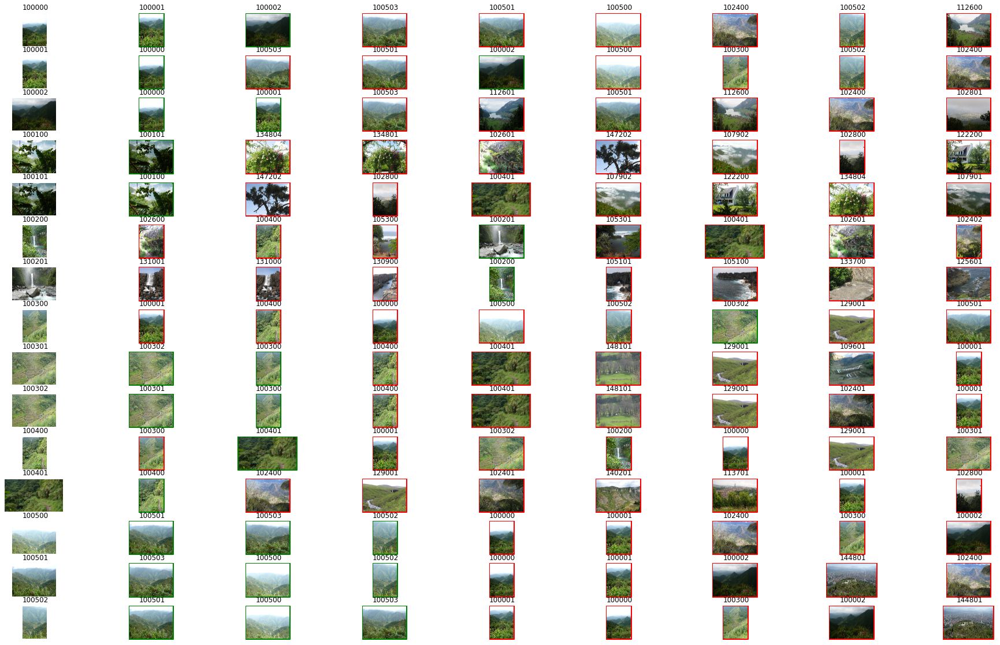

In [35]:
from matplotlib import pyplot as plt
from matplotlib.image import imread

nrow = 15   # number of query images to show
nres = 8   # number of results per query

def show_image(imno, frame_color):
    im = imread((os.path.join(PATH_TO_RESOURCES, PATH_TO_IMGS)) + "/%s.jpg" % IMG_IDS[imno])
    plt.imshow(im)
    h, w = im.shape[:2]
    plt.plot([0, 0, w, w, 0], [0, h, h, 0, 0], frame_color, linewidth = 2)
    plt.axis('off')

# reduce the margins
plt.subplots_adjust(wspace = 0, hspace = 0,
                    top = 0.99, bottom = 0.01, left = 0.01, right = 0.99)

plt.figure(figsize=(32,20))
no = 1  # index current of subfigure
for qno in range(nrow):
    plt.subplot(nrow, nres + 1, no); no += 1
    # show query image with white outline
    qimno = query_imnos[qno]
    show_image(qimno, 'w')
    plt.title(IMG_IDS[qimno])
    for res_rank, qres in enumerate(results[qno, 1:nres+1]): # 1:nres+1 => skip query from results
        plt.subplot(nrow, nres + 1, no); no += 1
        # use image name to determine if it is a TP or FP result
        is_ok = IMG_IDS[qres] in gt_data[IMG_IDS[qimno]]
        show_image(qres, 'g' if is_ok else 'r')
#         plt.title("%0.2f" % (distances[qno,res_rank]))
        plt.title(IMG_IDS[qres])

plt.show()

## Siamese (TUTO KERAS adapté pour INRIA) : le réseau d'embedding diffère.

In [ ]:
PATH_TO_IMGS = "imgs/jpg"

La delicieuse GT de Matzim

In [ ]:
PATH_TO_RESOURCES = "./gdrive/MyDrive/projet_DLIM/"
PATH_TO_GT = os.path.join(PATH_TO_RESOURCES, "INRIA_HOLYDAYS.json")
gt_data = None
with open(PATH_TO_GT, 'r') as in_gt:
    gt_data = json.load(in_gt)

Utils

In [ ]:
IMG_NAMES_FULL = !ls $PATH_TO_RESOURCES/$PATH_TO_IMGS/*.jpg | sort
len(IMG_NAMES_FULL), IMG_NAMES_FULL[:5]

(1491,
 ['./gdrive/MyDrive/projet_DLIM//imgs/jpg/100000.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100001.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100002.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100100.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100101.jpg'])

In [ ]:
IMG_IDS = [p.split('/')[-1][:-4] for p in IMG_NAMES_FULL]
len(IMG_IDS), IMG_IDS[:5]

(1491, ['100000', '100001', '100002', '100100', '100101'])

In [ ]:
imgid_to_index = {imgid: ii for ii, imgid in enumerate(IMG_IDS)}
imgid_to_index

In [ ]:
query_imnos = [imgid_to_index[query_id] for query_id in gt_data.keys()]

In [ ]:
len(query_imnos)

1491

In [ ]:
#anchor_path = [PATH_TO_RESOURCES + "/thumbs/" + str(imgid) + ".jpg" for imgid in list(gt_data.keys())]

In [ ]:
#posi_path = [PATH_TO_RESOURCES + "/thumbs/" + str(posimgid[0]) + ".jpg" for posimgid in list(gt_data.values())]

Anchor path et posi path: j'ai essayé de faire des paires entre l'ancre et toutes les images "reliées" c'est pour ça qu'on aura
len(anchor_path), len(posi_path) = (4144, 4144) plutôt que (500, ...)

In [ ]:
anchor_path = []
posi_path = []

In [ ]:
values = list(gt_data.values())

In [ ]:
for ii, imgid in enumerate(list(gt_data.keys())):
  for posi in values[ii]:
    anchor_path.append(PATH_TO_RESOURCES + PATH_TO_IMGS + "/" + str(imgid) + ".jpg")
    posi_path.append(PATH_TO_RESOURCES + PATH_TO_IMGS + "/" + str(posi) + ".jpg")

In [ ]:
len(anchor_path), len(posi_path)

(4144, 4144)

In [ ]:
image_count = len(anchor_path)

In [ ]:
target_shape = (224, 224)

def preprocess_image(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """

    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, target_shape)
    return image


def preprocess_triplets(anchor, positive, negative):
    """
    Given the filenames corresponding to the three images, load and
    preprocess them.
    """

    return (
        preprocess_image(anchor),
        preprocess_image(positive),
        preprocess_image(negative),
    )

Pour construire les embeddings des requêtes avec le preprocess pour resnet.

In [ ]:
def preprocess_image_for_embedding(filename):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """
    image = tf.keras.utils.load_img(filename)
    image = image.convert('RGB')
    image = image.resize((target_shape))
    x = np.array(image)
    x = preprocess_input(x)
    return x

In [ ]:
anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_path)
positive_dataset = tf.data.Dataset.from_tensor_slices(posi_path)

In [ ]:

# To generate the list of negative images, let's randomize the list of
# available images and concatenate them together.

# On shuffle avec la même seed pour garder la cohérence des paires.
rng = np.random.RandomState(seed=42)
rng.shuffle(anchor_path)
rng.shuffle(posi_path)

# Concat
negative_images = anchor_path + posi_path
np.random.RandomState(seed=32).shuffle(negative_images)

# On construit les négatives à partir de la concaténation des ancres et des images positives et on shuffle

negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)
negative_dataset = negative_dataset.shuffle(buffer_size= image_count * 2)

# Le dataset avec les triplets
dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))
dataset = dataset.shuffle(buffer_size=image_count)
dataset = dataset.map(preprocess_triplets)

# Let's now split our dataset in train and validation.
train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(32, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(32, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

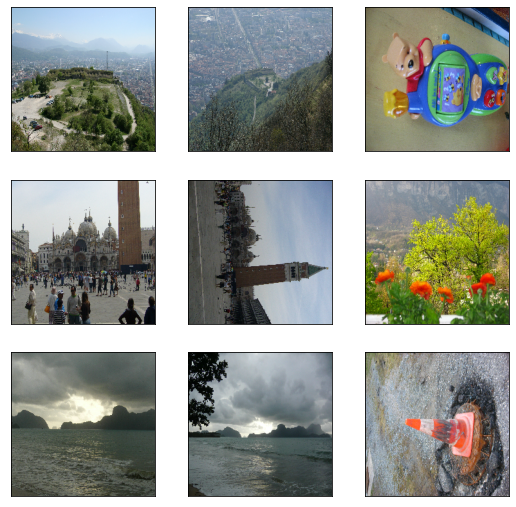

In [ ]:
def visualize(anchor, positive, negative):
    """Visualize a few triplets from the supplied batches."""

    def show(ax, image):
        ax.imshow(image)
        ax.get_xaxis().set_visible(False)
        ax.get_yaxis().set_visible(False)

    fig = plt.figure(figsize=(9, 9))

    axs = fig.subplots(3, 3)
    for i in range(3):
        show(axs[i, 0], anchor[i])
        show(axs[i, 1], positive[i])
        show(axs[i, 2], negative[i])


visualize(*list(train_dataset.take(1).as_numpy_iterator())[0])

Resnet avec un pooling avg juste avant de flatten. On freeze tout sauf la fin de resnet.

In [ ]:
base_cnn = resnet.ResNet50(
    weights="imagenet", input_shape=target_shape + (3,), include_top=False, pooling="avg"
)

flatten = layers.Flatten()(base_cnn.output)
dense1 = layers.Dense(2048, activation="relu")(flatten)
dense1 = layers.BatchNormalization()(dense1)
dense2 = layers.Dense(2048, activation="relu")(dense1)
dense2 = layers.BatchNormalization()(dense2)
output = layers.Dense(2048)(dense2)

embedding = Model(base_cnn.input, output, name="Embedding")

trainable = False
for layer in base_cnn.layers:
    if layer.name == "conv5_block1_out":
        trainable = True
    layer.trainable = trainable

In [ ]:
embedding.summary()

Model: "Embedding"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 230, 230, 3)  0           ['input_1[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 112, 112, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                          

In [ ]:
class DistanceLayer(layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, anchor, positive, negative):
        ap_distance = tf.reduce_sum(tf.square(anchor - positive), -1)
        an_distance = tf.reduce_sum(tf.square(anchor - negative), -1)
        return (ap_distance, an_distance)


anchor_input = layers.Input(name="anchor", shape=target_shape + (3,))
positive_input = layers.Input(name="positive", shape=target_shape + (3,))
negative_input = layers.Input(name="negative", shape=target_shape + (3,))

distances = DistanceLayer()(
    embedding(resnet.preprocess_input(anchor_input)),
    embedding(resnet.preprocess_input(positive_input)),
    embedding(resnet.preprocess_input(negative_input)),
)

siamese_network = Model(
    inputs=[anchor_input, positive_input, negative_input], outputs=distances
)

In [ ]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape is a context manager that records every operation that
        # you do inside. We are using it here to compute the loss so we can get
        # the gradients and apply them using the optimizer specified in
        # `compile()`.
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        # Storing the gradients of the loss function with respect to the
        # weights/parameters.
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_network.trainable_weights)
        )

        # Let's update and return the training loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        # Let's update and return the loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        # The output of the network is a tuple containing the distances
        # between the anchor and the positive example, and the anchor and
        # the negative example.
        ap_distance, an_distance = self.siamese_network(data)

        # Computing the Triplet Loss by subtracting both distances and
        # making sure we don't get a negative value.
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)
        return loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]

In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(0.0001))

In [ ]:
siamese_network.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 anchor (InputLayer)            [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 positive (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                                
                                                                                                  
 negative (InputLayer)          [(None, 224, 224, 3  0           []                               
                                )]                                                            

In [ ]:
#siamese_model.fit(train_dataset, epochs=1, validation_data=val_dataset)
siamese_model.fit(train_dataset, epochs=5, validation_data=val_dataset)

Epoch 1/5
104/104 [==============================] - ETA: 0s - loss: 0.2059

104/104 [==============================] - 212s 2s/step - loss: 0.2059 - val_loss: 0.1497
Epoch 2/5
104/104 [==============================] - ETA: 0s - loss: 0.1656

104/104 [==============================] - 200s 2s/step - loss: 0.1656 - val_loss: 0.1213
Epoch 3/5
104/104 [==============================] - ETA: 0s - loss: 0.1334

104/104 [==============================] - 200s 2s/step - loss: 0.1334 - val_loss: 0.1345
Epoch 4/5
104/104 [==============================] - ETA: 0s - loss: 0.1330

104/104 [==============================] - 199s 2s/step - loss: 0.1330 - val_loss: 0.1223
Epoch 5/5
104/104 [==============================] - ETA: 0s - loss: 0.1081

104/104 [==============================] - 200s 2s/step - loss: 0.1081 - val_loss: 0.0854


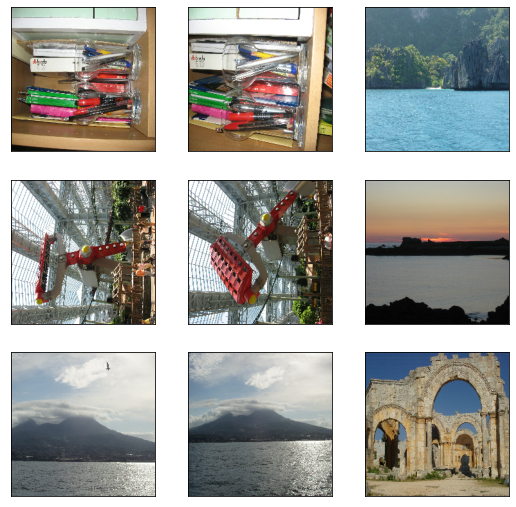

In [ ]:
sample = next(iter(train_dataset))
visualize(*sample)

anchor, positive, negative = sample
anchor_embedding, positive_embedding, negative_embedding = (
    embedding(resnet.preprocess_input(anchor)),
    embedding(resnet.preprocess_input(positive)),
    embedding(resnet.preprocess_input(negative)),
)

Juste pour voir ce que ça donne avec la cosine similarity (osef un peu)

In [ ]:
cosine_similarity = metrics.CosineSimilarity()

positive_similarity = cosine_similarity(anchor_embedding, positive_embedding)
print("Positive similarity:", positive_similarity.numpy())

negative_similarity = cosine_similarity(anchor_embedding, negative_embedding)
print("Negative similarity", negative_similarity.numpy())

Positive similarity: 0.99891686
Negative similarity 0.9967617


Un peu long a calculer mais il n'y a besoin de le faire qu'une fois.

In [ ]:
ref = []
# for path in anchor_path:
for path in IMG_NAMES_FULL:
  tmp_img = preprocess_image_for_embedding(path)
  ref.append(tmp_img)
ref = np.array(ref)

In [ ]:
ref.shape

(1491, 224, 224, 3)

In [ ]:
ref_embedding = embedding(ref)

In [ ]:
ref_embedding = np.array(ref_embedding)

On a donc les embeddings (vecteurs) de toutes les images.

In [ ]:
search_engine = NearestNeighbors()
search_engine.fit(ref_embedding)

NearestNeighbors()

On recupère les embeddings des requêtes et on cherche les 9 plus proches embeddings avec KNN car on veut les 8 plus proches voisins de la requête (donc 9 - le vecteur qui correspond à la requête = 8)

In [ ]:
query_vectors = embedding(ref[query_imnos])
query_vectors = np.array(query_vectors)
distances, results = search_engine.kneighbors(query_vectors, 9)

Code du TP pour la mAP

In [ ]:
# TODO complete this code
aps = []  # list of average precisions for all queries
for qimno, qres in zip(query_imnos, results):
    qname = IMG_IDS[qimno]
#     print("query:", qname)
    # collect the positive results in the dataset
    # the positives have the same prefix as the query image
    positive_results = [imgid_to_index[img_id] for img_id in gt_data[IMG_IDS[qimno]]]
#     print("positive_results:", positive_results)
#     print("qres:", qres)
    #
    # ranks of positives. We skip the result #0, assumed to be the query image
    ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
#     print("ranks:", ranks)
    #
    # accumulate trapezoids with this basis
    recall_step = 1.0 / len(positive_results)  # FIXME what is the size of a step?
    ap = 0
    for ntp, rank in enumerate(ranks):
        # ntp = nb of true positives so far
        # rank = nb of retrieved items so far
        # y-size on left side of trapezoid:
        precision_0 = ntp/float(rank) if rank > 0 else 1.0
        # y-size on right side of trapezoid:
        precision_1 = (ntp + 1) / float(rank + 1)
        ap += recall_step * precision_0 + (recall_step * (precision_1 - precision_0)) / 2 # FIXME what is the area under the PR curve?
    print("query %s, AP = %.3f" % (qname, ap))
    aps.append(ap)

print("mean AP = %.3f" % np.mean(aps))  # FIXME mean average precision

query 100000, AP = 0.708
query 100001, AP = 0.708
query 100002, AP = 1.000
query 100100, AP = 1.000
query 100101, AP = 1.000
query 100200, AP = 0.000
query 100201, AP = 0.167
query 100300, AP = 0.148
query 100301, AP = 1.000
query 100302, AP = 1.000
query 100400, AP = 0.125
query 100401, AP = 0.000
query 100500, AP = 1.000
query 100501, AP = 1.000
query 100502, AP = 1.000
query 100503, AP = 0.817
query 100600, AP = 1.000
query 100601, AP = 1.000
query 100700, AP = 0.250
query 100701, AP = 1.000
query 100800, AP = 1.000
query 100801, AP = 1.000
query 100900, AP = 0.500
query 100901, AP = 0.000
query 100902, AP = 0.500
query 101000, AP = 1.000
query 101001, AP = 1.000
query 101100, AP = 1.000
query 101101, AP = 1.000
query 101200, AP = 1.000
query 101201, AP = 1.000
query 101300, AP = 0.000
query 101301, AP = 0.000
query 101400, AP = 0.866
query 101401, AP = 1.000
query 101402, AP = 1.000
query 101403, AP = 0.500
query 101404, AP = 0.299
query 101500, AP = 0.750
query 101501, AP = 0.677


<Figure size 432x288 with 0 Axes>

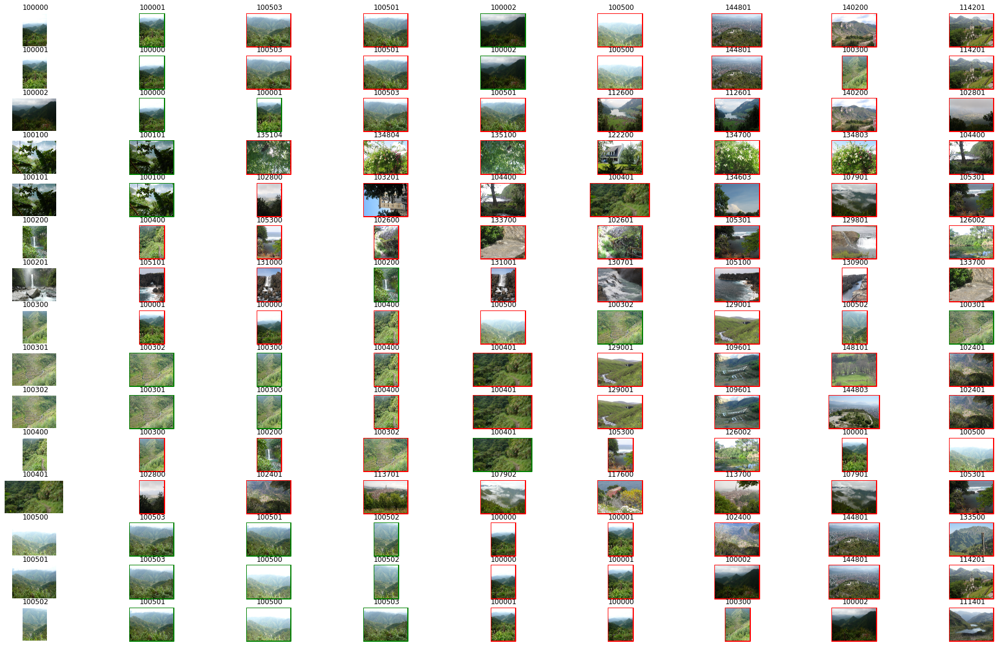

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.image import imread

nrow = 15   # number of query images to show
nres = 8   # number of results per query

def show_image(imno, frame_color):
    im = imread((os.path.join(PATH_TO_RESOURCES, PATH_TO_IMGS)) + "/%s.jpg" % IMG_IDS[imno])
    plt.imshow(im)
    h, w = im.shape[:2]
    plt.plot([0, 0, w, w, 0], [0, h, h, 0, 0], frame_color, linewidth = 2)
    plt.axis('off')

# reduce the margins
plt.subplots_adjust(wspace = 0, hspace = 0,
                    top = 0.99, bottom = 0.01, left = 0.01, right = 0.99)

plt.figure(figsize=(32,20))
no = 1  # index current of subfigure
for qno in range(nrow):
    plt.subplot(nrow, nres + 1, no); no += 1
    # show query image with white outline
    qimno = query_imnos[qno]
    show_image(qimno, 'w')
    plt.title(IMG_IDS[qimno])
    for res_rank, qres in enumerate(results[qno, 1:nres+1]): # 1:nres+1 => skip query from results
        plt.subplot(nrow, nres + 1, no); no += 1
        # use image name to determine if it is a TP or FP result
        is_ok = IMG_IDS[qres] in gt_data[IMG_IDS[qimno]]
        show_image(qres, 'g' if is_ok else 'r')
#         plt.title("%0.2f" % (distances[qno,res_rank]))
        plt.title(IMG_IDS[qres])

plt.show()

## Siamese hard triplets https://omoindrot.github.io/triplet-loss

Beaucoup de redondance avec la version précédente puisque j'ai c/c

In [ ]:
PATH_TO_IMGS = "imgs/jpg"

In [ ]:
PATH_TO_RESOURCES = "./gdrive/MyDrive/projet_DLIM/"
PATH_TO_GT = os.path.join(PATH_TO_RESOURCES, "INRIA_HOLYDAYS.json")
gt_data = None
with open(PATH_TO_GT, 'r') as in_gt:
    gt_data = json.load(in_gt)

In [ ]:
IMG_NAMES_FULL = !ls $PATH_TO_RESOURCES/$PATH_TO_IMGS/*.jpg | sort
len(IMG_NAMES_FULL), IMG_NAMES_FULL[:5]

(1491,
 ['./gdrive/MyDrive/projet_DLIM//imgs/jpg/100000.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100001.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100002.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100100.jpg',
  './gdrive/MyDrive/projet_DLIM//imgs/jpg/100101.jpg'])

In [ ]:
IMG_IDS = [p.split('/')[-1][:-4] for p in IMG_NAMES_FULL]
len(IMG_IDS), IMG_IDS[:5]

(1491, ['100000', '100001', '100002', '100100', '100101'])

In [ ]:
imgid_to_index = {imgid: ii for ii, imgid in enumerate(IMG_IDS)}
imgid_to_index

In [ ]:
query_imnos = [imgid_to_index[query_id] for query_id in gt_data.keys()]

In [ ]:
len(query_imnos)

1491

In [ ]:
#anchor_path = [PATH_TO_RESOURCES + "/thumbs/" + str(imgid) + ".jpg" for imgid in list(gt_data.keys())]

In [ ]:
#posi_path = [PATH_TO_RESOURCES + "/thumbs/" + str(posimgid[0]) + ".jpg" for posimgid in list(gt_data.values())]

Dans cette partie le réseau à besoin des images et des labels associés

In [ ]:
tmp = []

In [ ]:
anchor_path = []
labels = []

In [ ]:
values = list(gt_data.values())

La GT de Mazim contient 1491 requêtes au lieu de 500. Par exemple on a 
100000: [100001, 100002]
...
100001: [100000, 100002]
Donc il faut juste faire gaffe lorsque l'on construit les associations img/label

In [ ]:
for ii, imgid in enumerate(list(gt_data.keys())):
  if (imgid in tmp):
    continue
  tmp.append(imgid)
  labels.append(ii)
  anchor_path.append(PATH_TO_RESOURCES + PATH_TO_IMGS + "/" + str(imgid) + ".jpg")
  for posi in values[ii]:
    anchor_path.append(PATH_TO_RESOURCES + PATH_TO_IMGS + "/" + str(posi) + ".jpg")
    tmp.append(posi)
    labels.append(ii)

On a donc toutes les images avec le label associé

In [ ]:
len(anchor_path), len(labels)

(1491, 1491)

In [ ]:
image_count = len(anchor_path)

In [ ]:
target_shape = (224, 224)

def preprocess_image(filename, label):
    """
    Load the specified file as a JPEG image, preprocess it and
    resize it to the target shape.
    """
    print(filename, label)
    image_string = tf.io.read_file(filename)
    image = tf.image.decode_jpeg(image_string, channels=3)
    image = tf.image.convert_image_dtype(image, tf.float32)
    image = tf.image.resize(image, target_shape)
    return (image, label)

On construit un dataset (imgs, labels)

In [ ]:

anchor_dataset = tf.data.Dataset.from_tensor_slices(anchor_path)
labels_set = tf.data.Dataset.from_tensor_slices(labels)

#positive_dataset = tf.data.Dataset.from_tensor_slices(posi_path)

In [ ]:

# To generate the list of negative images, let's randomize the list of
# available images and concatenate them together.
"""rng = np.random.RandomState(seed=42)
rng.shuffle(anchor_path)
rng.shuffle(posi_path)

negative_images = anchor_path + posi_path
np.random.RandomState(seed=32).shuffle(negative_images)

negative_dataset = tf.data.Dataset.from_tensor_slices(negative_images)
negative_dataset = negative_dataset.shuffle(buffer_size= image_count * 2)

dataset = tf.data.Dataset.zip((anchor_dataset, positive_dataset, negative_dataset))"""
dataset = tf.data.Dataset.zip((anchor_dataset, labels_set))

dataset = dataset.shuffle(buffer_size=image_count)
dataset = dataset.map(preprocess_image)

# Let's now split our dataset in train and validation.
train_dataset = dataset.take(round(image_count * 0.8))
val_dataset = dataset.skip(round(image_count * 0.8))

train_dataset = train_dataset.batch(256, drop_remainder=False)
train_dataset = train_dataset.prefetch(8)

val_dataset = val_dataset.batch(256, drop_remainder=False)
val_dataset = val_dataset.prefetch(8)

Tensor("args_0:0", shape=(), dtype=string) Tensor("args_1:0", shape=(), dtype=int32)


Pareil qu'au dessus.

In [ ]:
base_cnn = resnet.ResNet50(
    weights="imagenet", input_shape=target_shape + (3,), include_top=False, pooling="avg"
)

flatten = layers.Flatten()(base_cnn.output)
dense1 = layers.Dense(2048, activation="relu")(flatten)
dense1 = layers.BatchNormalization()(dense1)
dense2 = layers.Dense(2048, activation="relu")(dense1)
dense2 = layers.BatchNormalization()(dense2)
output = layers.Dense(2048)(dense2)

embedding = Model(base_cnn.input, output, name="Embedding")

trainable = False
for layer in base_cnn.layers:
    if layer.name == "conv5_block1_out":
        trainable = True
    layer.trainable = trainable

Cette fois DistanceLayer renvoie toutes les distances et plus les distances (anchor/positive, anchor/neg) comme précédemment.

L'input est cette fois juste les embeddings des imgs du batch.

In [ ]:
class DistanceLayer(layers.Layer):
    """
    This layer is responsible for computing the distance between the anchor
    embedding and the positive embedding, and the anchor embedding and the
    negative embedding.
    """

    def __init__(self, **kwargs):
        super().__init__(**kwargs)

    def call(self, embeddings):
      dot_product = tf.matmul(embeddings, tf.transpose(embeddings))
      square_norm = tf.linalg.diag_part(dot_product)
      distances = tf.expand_dims(square_norm, 0) - 2.0 * dot_product + tf.expand_dims(square_norm, 1)
      distances = tf.maximum(distances, 0.0)
      return distances

input = layers.Input(name="anchor", shape=target_shape + (3,))

distances = DistanceLayer()(
    embedding(resnet.preprocess_input(input)),
)

siamese_network = Model(
    inputs=[input], outputs=distances
)

https://github.com/omoindrot/tensorflow-triplet-loss/blob/master/model/triplet_loss.py

In [ ]:
def _get_triplet_mask(labels):
    """Return a 3D mask where mask[a, p, n] is True iff the triplet (a, p, n) is valid.
    A triplet (i, j, k) is valid if:
        - i, j, k are distinct
        - labels[i] == labels[j] and labels[i] != labels[k]
    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]
    """
    # Check that i, j and k are distinct
    indices_equal = tf.cast(tf.eye(tf.shape(labels)[0]), tf.bool)
    indices_not_equal = tf.logical_not(indices_equal)
    i_not_equal_j = tf.expand_dims(indices_not_equal, 2)
    i_not_equal_k = tf.expand_dims(indices_not_equal, 1)
    j_not_equal_k = tf.expand_dims(indices_not_equal, 0)

    distinct_indices = tf.logical_and(tf.logical_and(i_not_equal_j, i_not_equal_k), j_not_equal_k)


    # Check if labels[i] == labels[j] and labels[i] != labels[k]
    label_equal = tf.equal(tf.expand_dims(labels, 0), tf.expand_dims(labels, 1))
    i_equal_j = tf.expand_dims(label_equal, 2)
    i_equal_k = tf.expand_dims(label_equal, 1)

    valid_labels = tf.logical_and(i_equal_j, tf.logical_not(i_equal_k))

    # Combine the two masks
    mask = tf.logical_and(distinct_indices, valid_labels)

    return mask

batch all: select all the valid triplets, and average the loss on the hard and semi-hard triplets.
a crucial point here is to not take into account the easy triplets (those with loss 
0
), as averaging on them would make the overall loss very small
this produces a total of 
P
K
(
K
−
1
)
(
P
K
−
K
)
 triplets (
P
K
 anchors, 
K
−
1
 possible positives per anchor, 
P
K
−
K
 possible negatives)

La structure est différente pour fonctionner avec le nouveau calcul de loss mais rien de spécial

In [ ]:
class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape is a context manager that records every operation that
        # you do inside. We are using it here to compute the loss so we can get
        # the gradients and apply them using the optimizer specified in
        # `compile()`.
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        # Storing the gradients of the loss function with respect to the
        # weights/parameters.
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_network.trainable_weights)
        )

        # Let's update and return the training loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        # Let's update and return the loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        imgs, labels = data
        # The output of the network is a tuple containing the distances
        # between the anchor and the positive example, and the anchor and
        # the negative example.
        """ap_distance, an_distance = self.siamese_network(data)
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)"""
        pairwise_dist = self.siamese_network(imgs)
  
        anchor_positive_dist = tf.expand_dims(pairwise_dist, 2)
        anchor_negative_dist = tf.expand_dims(pairwise_dist, 1)
        triplet_loss = anchor_positive_dist - anchor_negative_dist + self.margin

        # Put to zero the invalid triplets
        # (where label(a) != label(p) or label(n) == label(a) or a == p)
        mask = _get_triplet_mask(labels)
        #mask = tf.to_float(mask)

        mask = tf.cast(mask, tf.float32)
        triplet_loss = tf.multiply(mask, triplet_loss)

        # Remove negative losses (i.e. the easy triplets)
        triplet_loss = tf.maximum(triplet_loss, 0.0)

        # Count number of positive triplets (where triplet_loss > 0)
        valid_triplets = tf.cast(tf.greater(triplet_loss, 1e-16), tf.float32)
        #valid_triplets = tf.to_float(tf.greater(triplet_loss, 1e-16))
        num_positive_triplets = tf.reduce_sum(valid_triplets)
        num_valid_triplets = tf.reduce_sum(mask)
        #fraction_positive_triplets = num_positive_triplets / (num_valid_triplets + 1e-16)

        # Get final mean triplet loss over the positive valid triplets
        triplet_loss = tf.reduce_sum(triplet_loss) / (num_positive_triplets + 1e-16)
        return triplet_loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]

batch hard: for each anchor, select the hardest positive (biggest distance 
d
(
a
,
p
)
) and the hardest negative among the batch
this produces 
P
K
 triplets
the selected triplets are the hardest among the batch

In [ ]:
def _get_anchor_positive_triplet_mask(labels):
    """Return a 2D mask where mask[a, p] is True iff a and p are distinct and have same label.
    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]
    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check that i and j are distinct
    indices_equal = tf.cast(tf.eye(tf.shape(labels)[0]), tf.bool)
    indices_not_equal = tf.logical_not(indices_equal)

    # Check if labels[i] == labels[j]
    # Uses broadcasting where the 1st argument has shape (1, batch_size) and the 2nd (batch_size, 1)
    labels_equal = tf.equal(tf.expand_dims(labels, 0), tf.expand_dims(labels, 1))

    # Combine the two masks
    mask = tf.logical_and(indices_not_equal, labels_equal)

    return mask

def _get_anchor_negative_triplet_mask(labels):
    """Return a 2D mask where mask[a, n] is True iff a and n have distinct labels.
    Args:
        labels: tf.int32 `Tensor` with shape [batch_size]
    Returns:
        mask: tf.bool `Tensor` with shape [batch_size, batch_size]
    """
    # Check if labels[i] != labels[k]
    # Uses broadcasting where the 1st argument has shape (1, batch_size) and the 2nd (batch_size, 1)
    labels_equal = tf.equal(tf.expand_dims(labels, 0), tf.expand_dims(labels, 1))

    mask = tf.logical_not(labels_equal)

    return mask

class SiameseModel(Model):
    """The Siamese Network model with a custom training and testing loops.

    Computes the triplet loss using the three embeddings produced by the
    Siamese Network.

    The triplet loss is defined as:
       L(A, P, N) = max(‖f(A) - f(P)‖² - ‖f(A) - f(N)‖² + margin, 0)
    """

    def __init__(self, siamese_network, margin=0.5):
        super(SiameseModel, self).__init__()
        self.siamese_network = siamese_network
        self.margin = margin
        self.loss_tracker = metrics.Mean(name="loss")

    def call(self, inputs):
        return self.siamese_network(inputs)

    def train_step(self, data):
        # GradientTape is a context manager that records every operation that
        # you do inside. We are using it here to compute the loss so we can get
        # the gradients and apply them using the optimizer specified in
        # `compile()`.
        with tf.GradientTape() as tape:
            loss = self._compute_loss(data)

        # Storing the gradients of the loss function with respect to the
        # weights/parameters.
        gradients = tape.gradient(loss, self.siamese_network.trainable_weights)

        # Applying the gradients on the model using the specified optimizer
        self.optimizer.apply_gradients(
            zip(gradients, self.siamese_network.trainable_weights)
        )

        # Let's update and return the training loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def test_step(self, data):
        loss = self._compute_loss(data)

        # Let's update and return the loss metric.
        self.loss_tracker.update_state(loss)
        return {"loss": self.loss_tracker.result()}

    def _compute_loss(self, data):
        imgs, labels = data
        # The output of the network is a tuple containing the distances
        # between the anchor and the positive example, and the anchor and
        # the negative example.
        """ap_distance, an_distance = self.siamese_network(data)
        loss = ap_distance - an_distance
        loss = tf.maximum(loss + self.margin, 0.0)"""
        pairwise_dist = self.siamese_network(imgs)
  
        # For each anchor, get the hardest positive
        # First, we need to get a mask for every valid positive (they should have same label)
        mask_anchor_positive = _get_anchor_positive_triplet_mask(labels)
        #mask_anchor_positive = tf.to_float(mask_anchor_positive)
        mask_anchor_positive = tf.cast(mask_anchor_positive, tf.float32)
        # We put to 0 any element where (a, p) is not valid (valid if a != p and label(a) == label(p))
        anchor_positive_dist = tf.multiply(mask_anchor_positive, pairwise_dist)

        # shape (batch_size, 1)
        hardest_positive_dist = tf.reduce_max(anchor_positive_dist, axis=1, keepdims=True)
        tf.summary.scalar("hardest_positive_dist", tf.reduce_mean(hardest_positive_dist))

        # For each anchor, get the hardest negative
        # First, we need to get a mask for every valid negative (they should have different labels)
        mask_anchor_negative = _get_anchor_negative_triplet_mask(labels)
        #mask_anchor_negative = tf.to_float(mask_anchor_negative)
        mask_anchor_negative =  tf.cast(mask_anchor_negative, tf.float32)
        # We add the maximum value in each row to the invalid negatives (label(a) == label(n))
        max_anchor_negative_dist = tf.reduce_max(pairwise_dist, axis=1, keepdims=True)
        anchor_negative_dist = pairwise_dist + max_anchor_negative_dist * (1.0 - mask_anchor_negative)

        # shape (batch_size,)
        hardest_negative_dist = tf.reduce_min(anchor_negative_dist, axis=1, keepdims=True)
        tf.summary.scalar("hardest_negative_dist", tf.reduce_mean(hardest_negative_dist))

        # Combine biggest d(a, p) and smallest d(a, n) into final triplet loss
        triplet_loss = tf.maximum(hardest_positive_dist - hardest_negative_dist + self.margin, 0.0)

        # Get final mean triplet loss
        triplet_loss = tf.reduce_mean(triplet_loss)
        return triplet_loss

    @property
    def metrics(self):
        # We need to list our metrics here so the `reset_states()` can be
        # called automatically.
        return [self.loss_tracker]

In [ ]:
siamese_model = SiameseModel(siamese_network)
siamese_model.compile(optimizer=optimizers.Adam(0.0001))

In [ ]:
siamese_network.summary()

Model: "model_8"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 anchor (InputLayer)         [(None, 224, 224, 3)]     0         
                                                                 
 tf.__operators__.getitem_8   (None, 224, 224, 3)      0         
 (SlicingOpLambda)                                               
                                                                 
 tf.nn.bias_add_8 (TFOpLambd  (None, 224, 224, 3)      0         
 a)                                                              
                                                                 
 Embedding (Functional)      (None, 2048)              36193152  
                                                                 
 distance_layer_8 (DistanceL  (None, None)             0         
 ayer)                                                           
                                                           

In [ ]:
#siamese_model.fit(train_dataset, epochs=1, validation_data=val_dataset)
siamese_model.fit(train_dataset, epochs=25, validation_data=val_dataset)

Epoch 1/25
5/5 [==============================] - 33s 7s/step - loss: 0.2822 - val_loss: 0.1433
Epoch 2/25
5/5 [==============================] - 28s 6s/step - loss: 0.2671 - val_loss: 0.1578
Epoch 3/25
5/5 [==============================] - 29s 6s/step - loss: 0.2836 - val_loss: 0.1927
Epoch 4/25
5/5 [==============================] - 29s 6s/step - loss: 0.2491 - val_loss: 0.1299
Epoch 5/25
5/5 [==============================] - 28s 6s/step - loss: 0.2375 - val_loss: 0.1559
Epoch 6/25
5/5 [==============================] - 28s 6s/step - loss: 0.2309 - val_loss: 0.1447
Epoch 7/25
5/5 [==============================] - 29s 6s/step - loss: 0.2298 - val_loss: 0.1881
Epoch 8/25
5/5 [==============================] - 28s 6s/step - loss: 0.2354 - val_loss: 0.1348
Epoch 9/25
5/5 [==============================] - 28s 6s/step - loss: 0.2210 - val_loss: 0.1533
Epoch 10/25
5/5 [==============================] - 29s 6s/step - loss: 0.2036 - val_loss: 0.1191
Epoch 11/25
5/5 [======================

Pareil que tout à l'heure, on calcule les embeddings des images etc

In [ ]:
ref = []
# for path in anchor_path:
for path in IMG_NAMES_FULL:
  tmp_img = preprocess_image_for_embedding(path)
  ref.append(tmp_img)
ref = np.array(ref)

In [ ]:
ref.shape

(1491, 224, 224, 3)

In [ ]:
ref_embedding = embedding(ref)

In [ ]:
ref_embedding = np.array(ref_embedding)

In [ ]:
search_engine = NearestNeighbors()
search_engine.fit(ref_embedding)

NearestNeighbors()

In [ ]:
query_vectors = embedding(ref[query_imnos])
query_vectors = np.array(query_vectors)
distances, results = search_engine.kneighbors(query_vectors, 9)

In [ ]:
# TODO complete this code
aps = []  # list of average precisions for all queries
for qimno, qres in zip(query_imnos, results):
    qname = IMG_IDS[qimno]
#     print("query:", qname)
    # collect the positive results in the dataset
    # the positives have the same prefix as the query image
    positive_results = [imgid_to_index[img_id] for img_id in gt_data[IMG_IDS[qimno]]]
#     print("positive_results:", positive_results)
#     print("qres:", qres)
    #
    # ranks of positives. We skip the result #0, assumed to be the query image
    ranks = [i for i, res in enumerate(qres[1:]) if res in positive_results]
#     print("ranks:", ranks)
    #
    # accumulate trapezoids with this basis
    recall_step = 1.0 / len(positive_results)  # FIXME what is the size of a step?
    ap = 0
    for ntp, rank in enumerate(ranks):
        # ntp = nb of true positives so far
        # rank = nb of retrieved items so far
        # y-size on left side of trapezoid:
        precision_0 = ntp/float(rank) if rank > 0 else 1.0
        # y-size on right side of trapezoid:
        precision_1 = (ntp + 1) / float(rank + 1)
        ap += recall_step * precision_0 + (recall_step * (precision_1 - precision_0)) / 2 # FIXME what is the area under the PR curve?
    print("query %s, AP = %.3f" % (qname, ap))
    aps.append(ap)

print("mean AP = %.3f" % np.mean(aps))  # FIXME mean average precision

query 100000, AP = 0.708
query 100001, AP = 0.662
query 100002, AP = 0.258
query 100100, AP = 1.000
query 100101, AP = 1.000
query 100200, AP = 0.000
query 100201, AP = 0.250
query 100300, AP = 0.000
query 100301, AP = 1.000
query 100302, AP = 1.000
query 100400, AP = 1.000
query 100401, AP = 0.125
query 100500, AP = 0.903
query 100501, AP = 1.000
query 100502, AP = 1.000
query 100503, AP = 0.817
query 100600, AP = 0.000
query 100601, AP = 0.100
query 100700, AP = 1.000
query 100701, AP = 1.000
query 100800, AP = 1.000
query 100801, AP = 1.000
query 100900, AP = 0.500
query 100901, AP = 0.000
query 100902, AP = 0.613
query 101000, AP = 1.000
query 101001, AP = 1.000
query 101100, AP = 1.000
query 101101, AP = 1.000
query 101200, AP = 1.000
query 101201, AP = 1.000
query 101300, AP = 0.000
query 101301, AP = 0.000
query 101400, AP = 0.750
query 101401, AP = 1.000
query 101402, AP = 0.944
query 101403, AP = 0.750
query 101404, AP = 0.193
query 101500, AP = 0.944
query 101501, AP = 0.944


<Figure size 432x288 with 0 Axes>

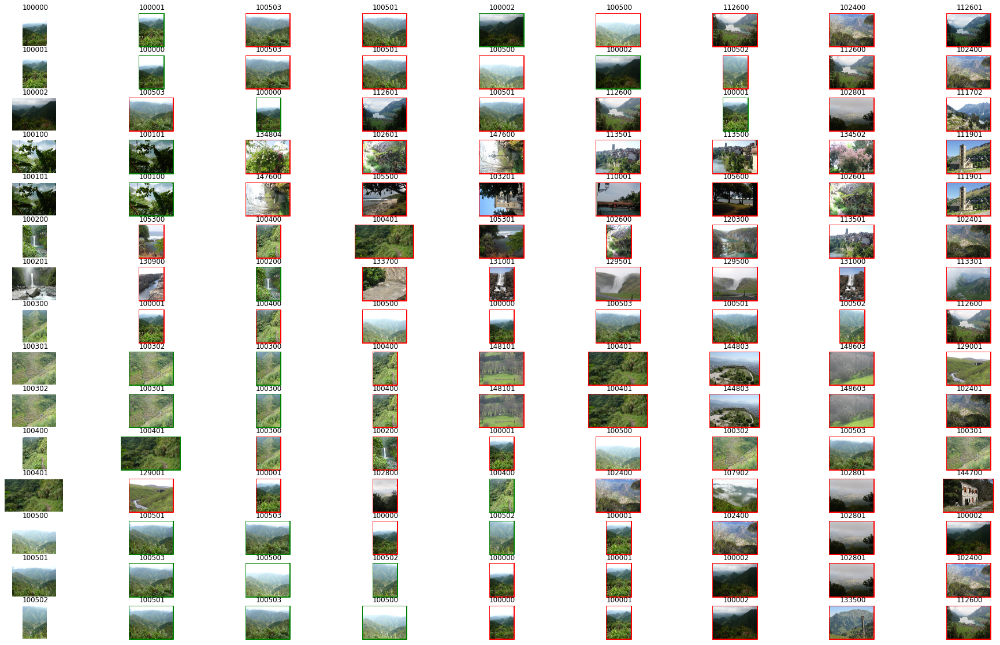

In [ ]:
from matplotlib import pyplot as plt
from matplotlib.image import imread

nrow = 15   # number of query images to show
nres = 8   # number of results per query

def show_image(imno, frame_color):
    im = imread((os.path.join(PATH_TO_RESOURCES, PATH_TO_IMGS)) + "/%s.jpg" % IMG_IDS[imno])
    plt.imshow(im)
    h, w = im.shape[:2]
    plt.plot([0, 0, w, w, 0], [0, h, h, 0, 0], frame_color, linewidth = 2)
    plt.axis('off')

# reduce the margins
plt.subplots_adjust(wspace = 0, hspace = 0,
                    top = 0.99, bottom = 0.01, left = 0.01, right = 0.99)

plt.figure(figsize=(32,20))
no = 1  # index current of subfigure
for qno in range(nrow):
    plt.subplot(nrow, nres + 1, no); no += 1
    # show query image with white outline
    qimno = query_imnos[qno]
    show_image(qimno, 'w')
    plt.title(IMG_IDS[qimno])
    for res_rank, qres in enumerate(results[qno, 1:nres+1]): # 1:nres+1 => skip query from results
        plt.subplot(nrow, nres + 1, no); no += 1
        # use image name to determine if it is a TP or FP result
        is_ok = IMG_IDS[qres] in gt_data[IMG_IDS[qimno]]
        show_image(qres, 'g' if is_ok else 'r')
#         plt.title("%0.2f" % (distances[qno,res_rank]))
        plt.title(IMG_IDS[qres])

plt.show()